# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Lane Finding** 
---

## Import Packages

In [1]:
#
# Project1 Find Road Lines in a Video
#

# Imports
import matplotlib.image as mpimg
import pickle
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

## Pipeline to process an image and overlay Line annotations

Next Cal image: 0
Next Cal image: 1
Next Cal image: 2
Next Cal image: 3
Next Cal image: 4
Next Cal image: 5
Next Cal image: 6
Next Cal image: 7
Next Cal image: 8
Next Cal image: 9
Next Cal image: 10
Next Cal image: 11
Next Cal image: 12
Next Cal image: 13
Next Cal image: 14
Next Cal image: 15
Next Cal image: 16
Next Cal image: 17
Next Cal image: 18
Next Cal image: 19


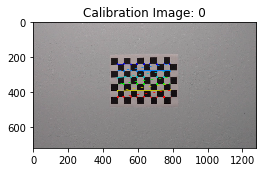

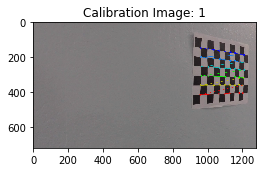

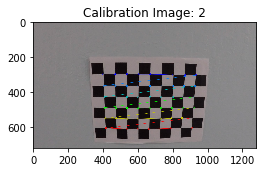

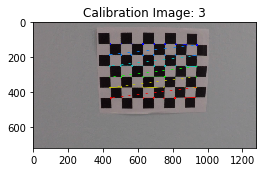

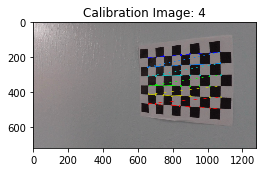

...

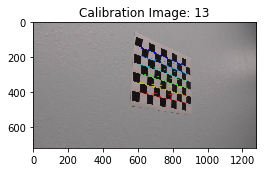

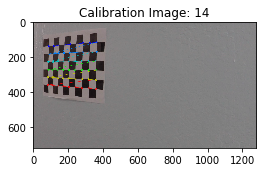

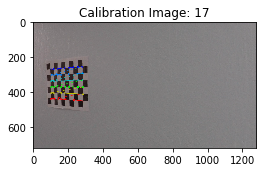

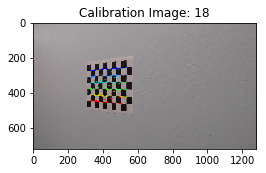

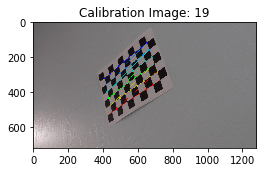

In [2]:
## Step 1. Perform camera calibration via chessboard method
nx = 9
ny = 6
cell_w = 1
cell_h = 20

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

def findCorners(displayit = True):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)


    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')
    
    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        if displayit:
            print("Next Cal image: " + str(idx))
        
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            if displayit:
                # Draw and display the corners
                cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
                fig, (img_box) = plt.subplots(1, 1, figsize=(4,4))
                img_box.imshow(img)
                plt.title("Calibration Image: " + str(idx))
            
findCorners()


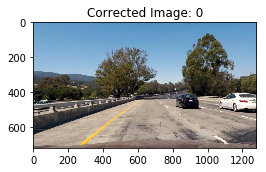

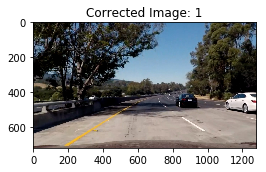

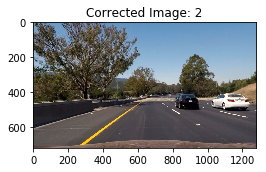

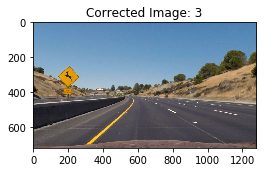

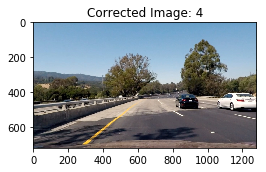

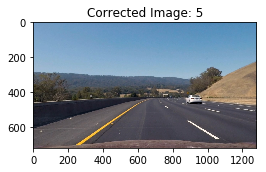

In [3]:
# Step 2. undistort images
import pickle
%matplotlib inline

def undistort_image(img):
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

def undistort_image_file(imgFile):
    img = cv2.imread(imgFile)
    return undistort_image(img)

processed_images = []
img_files = glob.glob('test_images/test*.jpg')
for imgFile in img_files:
    processed_images.append(undistort_image_file(imgFile))
    
idx=0    
for img in processed_images:    
    fig, (img_box) = plt.subplots(1, 1, figsize=(4,4))
    img_box.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Corrected Image: " + str(idx))
    idx+=1


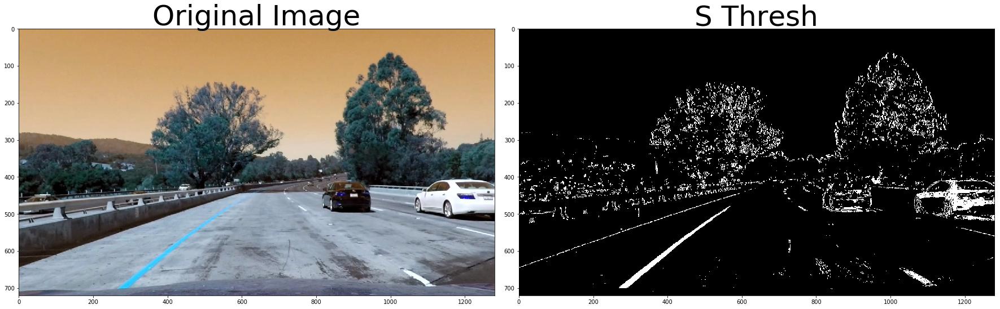

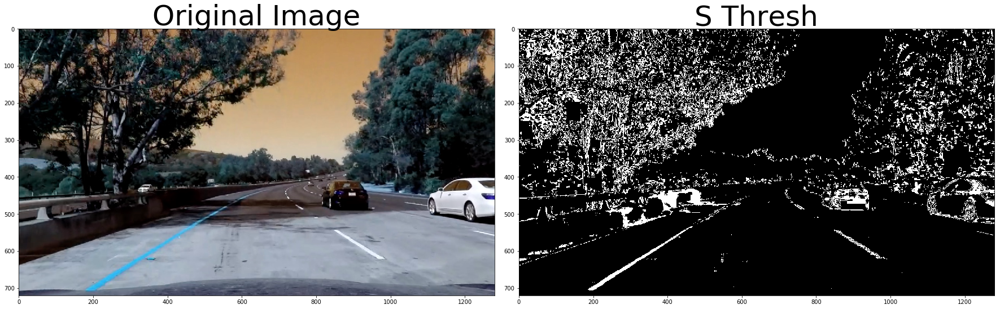

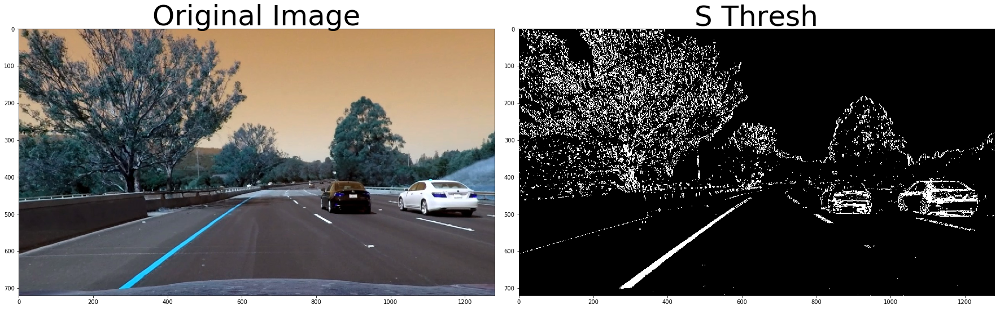

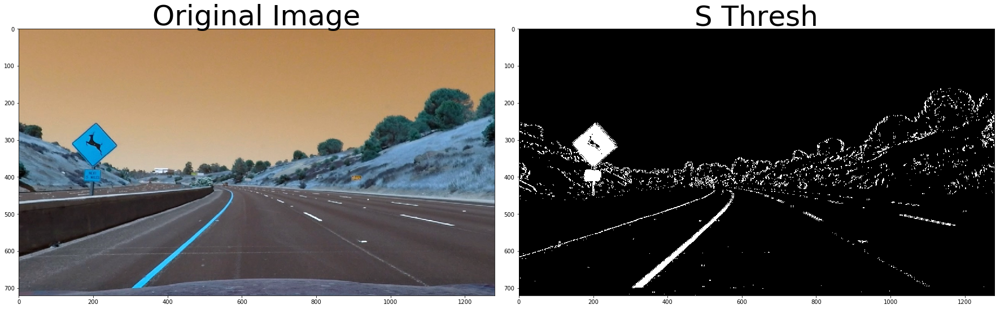

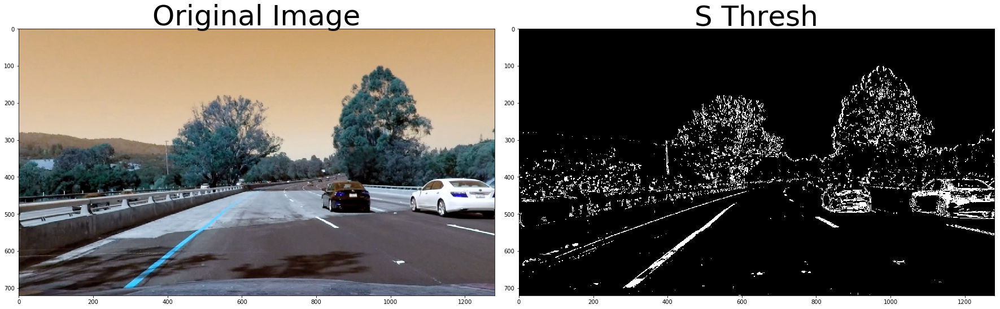

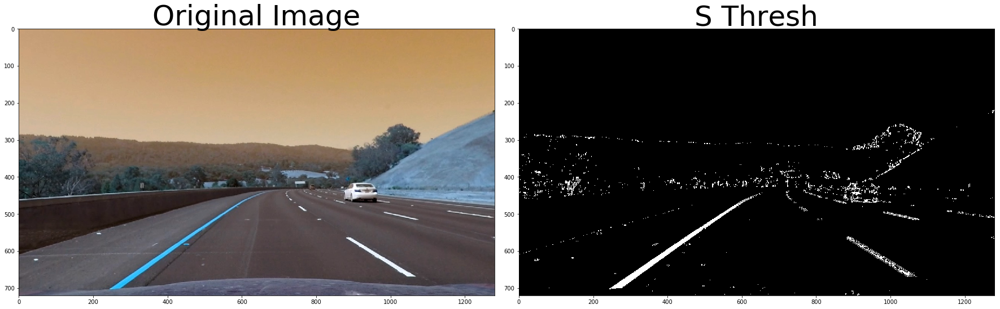

In [4]:
#Step 3. Use color transforms, gradients, etc., to create a thresholded binary image.

def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

def to_binary(img, s_thresh=(180, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    #color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    color_binary = np.zeros_like(s_binary)
    color_binary[(sxbinary == 1) | (s_binary == 1)] = 1

    return color_binary


binary_images = []
for img in processed_images:
    hls_binary = hls_select(img, thresh=(180,255))
    #binary_images.append(hls_binary)
    img_binary = to_binary(img, s_thresh=(180,255), sx_thresh=(30, 90))
    binary_images.append(img_binary)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(img_binary, cmap='gray')
    ax2.set_title('Combined Thresh', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

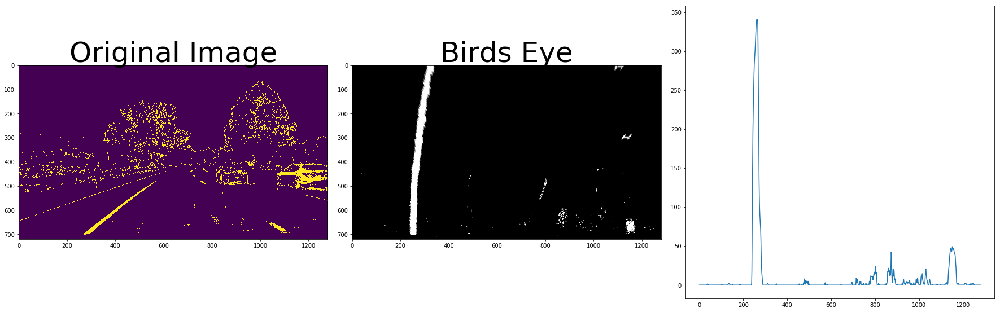

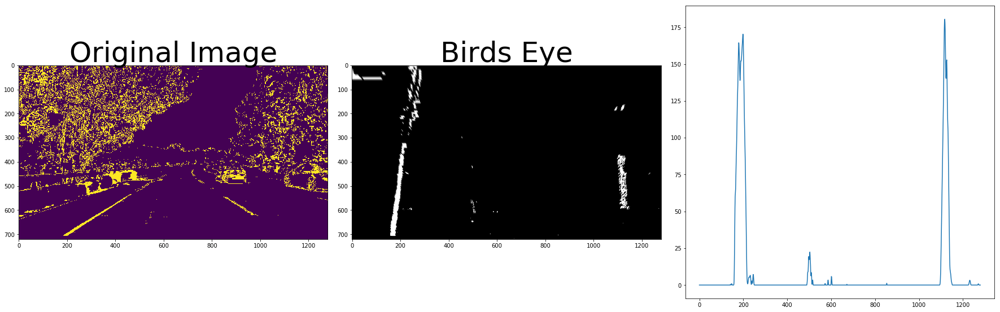

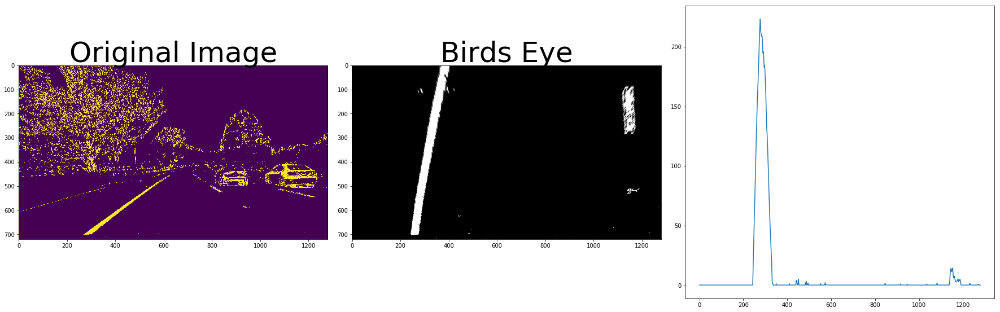

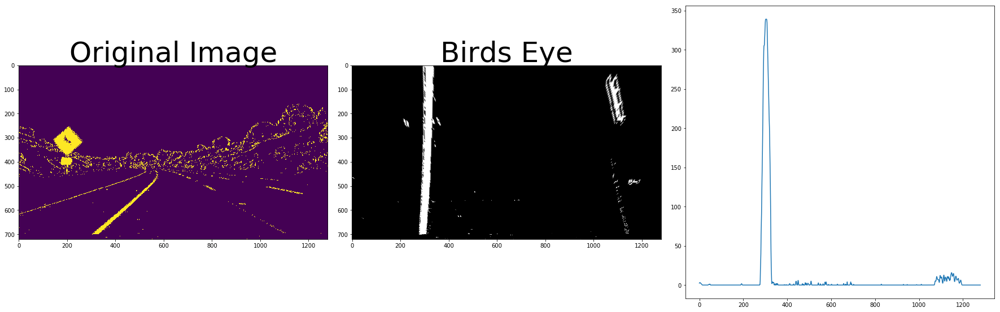

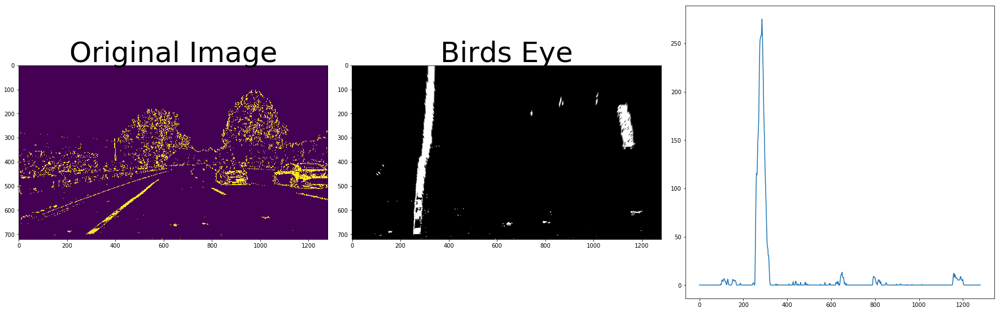

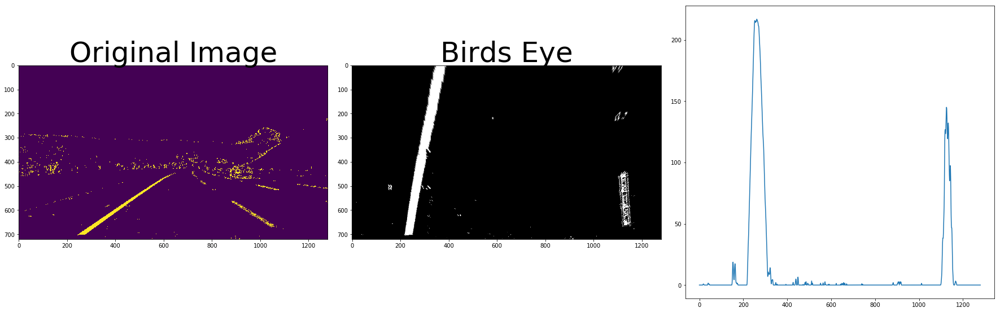

In [5]:
# Step 4: Apply a perspective transform to rectify binary image ("birds-eye view").
def to_birdseye(img):
    img_size = (img.shape[1], img.shape[0])
    offset = 0
    
    #Taken off IMAGE 6
    src = np.float32([  [460, 490],[820, 490],[1260, 720], [40, 720] ])
    dst = np.float32([  [0, 0],[1280, 0],[1260, 720], [40, 720] ])
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped_img = cv2.warpPerspective(img, M, img_size)
    return warped_img

birdseye_images = []
birdseye_color_images = []

for img in processed_images:
    birdseye_color_images.append(to_birdseye(img))

for img in binary_images:
    bin_img = to_birdseye(img)
    birdseye_images.append(bin_img)
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(bin_img, cmap='gray')
    ax2.set_title('Birds Eye', fontsize=50)
    histogram = np.sum(bin_img[bin_img.shape[0]//2:,:], axis=0)
    ax3.plot(histogram)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


1814.24197329 m 2513.3420409 m
35567.308292 m 1963.33908606 m
3471.9359912 m 8046.10800534 m
7168.01410418 m 1796.31795196 m
3190.93668254 m 2621.87407674 m


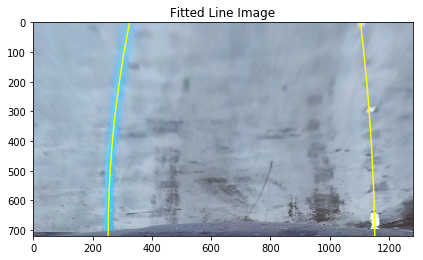

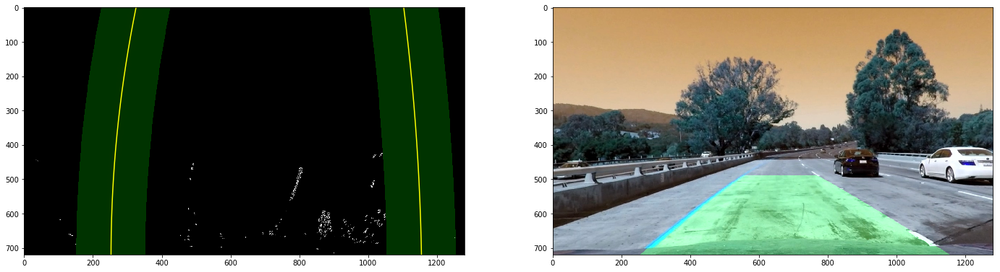

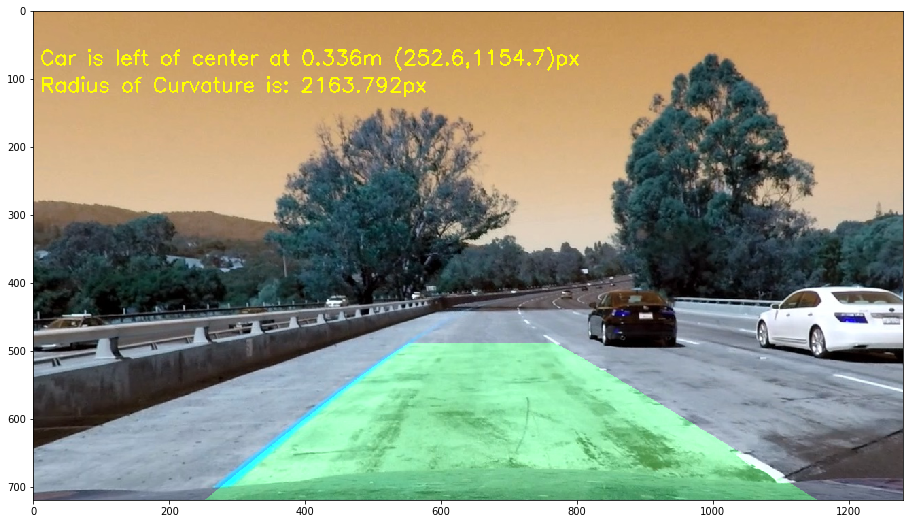

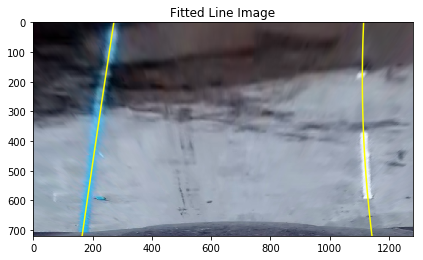

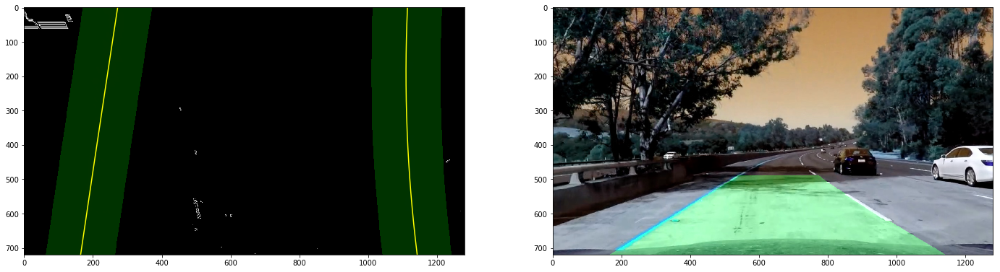

...

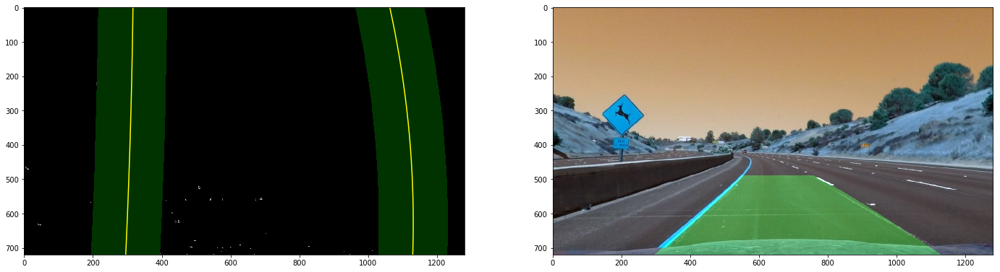

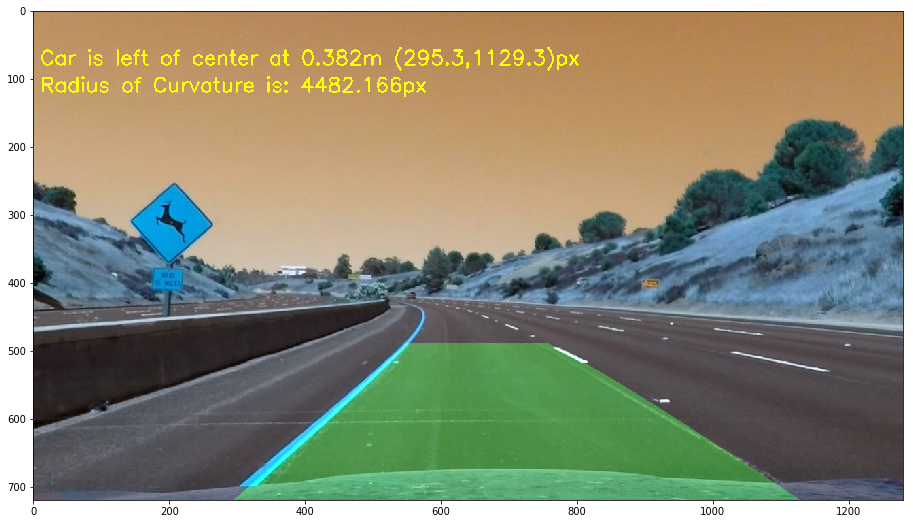

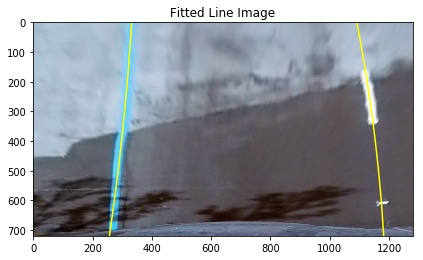

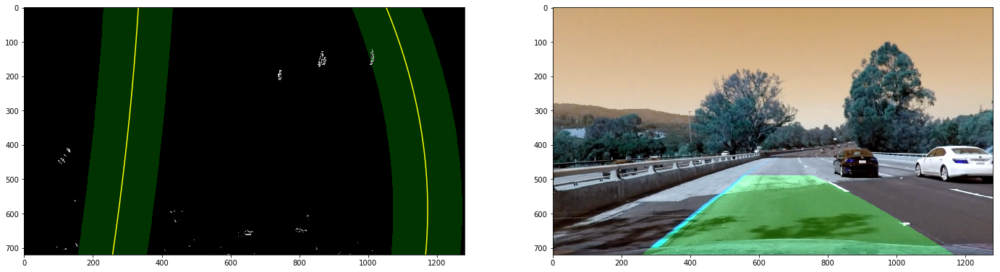

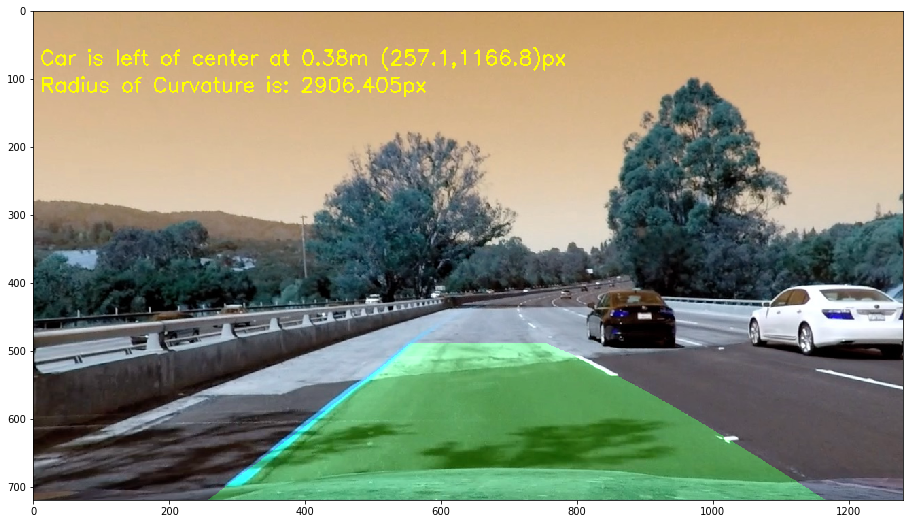

In [29]:
#Step 6: Detect lane pixels and fit to find the lane boundary.

def mov_avg_ctr(val, n=10) :
    ret = np.cumsum(val, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

def mov_avg_ctr(val, n=10) :
    ret = np.cumsum(val, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

# Create empty lists to receive left and right lane pixel indices
def fit_lanes(binary_warped, color_img, diplayit):
    global g_left_lane_inds
    global g_right_lane_inds
    global g_left_fit
    global g_right_fit
    
    #left_lane_inds.clear()
    #right_lane_inds.clear()
    
    # SEE LESSON 33
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
  
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    if diplayit:
        fig, ax = plt.subplots()
        fig.tight_layout()
        ax.imshow(to_birdseye(color_img))
        ax.plot(left_fitx, ploty, color='yellow')
        ax.plot(right_fitx, ploty, color='yellow')
        ax.set_title('Fitted Line Image')

    g_left_lane_inds = left_lane_inds
    g_right_lane_inds = right_lane_inds
    g_left_fit = left_fit
    g_right_fit = right_fit
    
    return out_img


def fill_poly(binary_warped, warped, clean_img, displayit):
    global g_left_fit
    global g_right_fit
    
    if displayit:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))

    # See lesson 33   
    
    # start sliding windows technique

    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (g_left_fit[0]*(nonzeroy**2) + g_left_fit[1]*nonzeroy + 
    g_left_fit[2] - margin)) & (nonzerox < (g_left_fit[0]*(nonzeroy**2) + 
    g_left_fit[1]*nonzeroy + g_left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (g_right_fit[0]*(nonzeroy**2) + g_right_fit[1]*nonzeroy + 
    g_right_fit[2] - margin)) & (nonzerox < (g_right_fit[0]*(nonzeroy**2) + 
    g_right_fit[1]*nonzeroy + g_right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
   
    # done sliding windows technique
    
    # save the data
    g_left_fit = left_fit
    g_right_fit = right_fit

    # visualize
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    if displayit:
        ax1.imshow(result)
        ax1.plot(left_fitx, ploty, color='yellow')
        ax1.plot(right_fitx, ploty, color='yellow')

        
    # lets go ahead and find the real workd position
    # aka radius of curvature and center offset
        
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(lefty)  # *ym_per_pix
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    
    if displayit:
        print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    radius_of_curvature = (left_curverad + right_curverad) / 2.0
    
    # rewarp back to vehicle position
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    # center assumed vehicle camera is at the center of the vehicle,
    # and that means the image, aka 1280x720
    virtual_center = 1280 / 2
    vehicle_centerline = abs(virtual_center - ((rightx_int+leftx_int)/2))
    # convert pixel to meters distance based on fhta specification
    center_offset = vehicle_centerline*0.00528
    center_offset = mov_avg_ctr(center_offset)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Take from section ABOVE
    src = np.float32([  [460, 490],[820, 490],[1260, 720], [40, 720] ])
    dst = np.float32([  [0, 0],[1280, 0],[1260, 720], [40, 720] ])

    # redo matrix
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(clean_img, 1, newwarp, 0.2, 0)
    
    if displayit:
        ax2.imshow(result)

    heading_txt = "Car is "

    # visualize it...
    
    if vehicle_centerline > virtual_center: # right of
        heading_txt += "right of center at " + str(format(round(center_offset,3))) + "m (" 
    else:
        heading_txt += "left of center at " + str(format(round(center_offset,3))) + "m (" 
        
    heading_txt += str(format(round(leftx_int,1))) + "," + str(format(round(rightx_int,1))) + ")px"
    
    
    np.convolve(radius_of_curvature, np.ones((25,))/25, mode='valid')

    radius_txt = "Radius of Curvature is: " + str(format(round(radius_of_curvature,3))) + "px"

    cv2.putText(result, 
            heading_txt, 
            (10, 80),
            cv2.FONT_HERSHEY_SIMPLEX,
            1.0,
            (255, 255, 0), 
            2);
    cv2.putText(result, 
            radius_txt, 
            (10, 120),
            cv2.FONT_HERSHEY_SIMPLEX,
            1.0,
            (255, 255, 0), 
            2);
        
    return result

left_fit = 0
right_fit = 0
g_left_lane_inds = []
g_right_lane_inds = []
g_left_fit = []
g_right_fit = []

#debug    
for idx in range(0,5):
    img = birdseye_images[idx]    
    fit_lanes(img, processed_images[idx], True)    
    res = fill_poly(img, birdseye_color_images[idx], processed_images[idx], True)
    f, (ax1) = plt.subplots(1, figsize=(24, 9))
    ax1.imshow(res)




In [28]:
#
# Project pipeline
#

from moviepy.editor import VideoFileClip
from IPython.display import HTML

left_fit = 0
right_fit = 0
g_left_lane_inds = []
g_right_lane_inds = []
g_left_fit = []
g_right_fit = []
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

print("start pipeline")

# calibrate camera
findCorners(False)

initialized = False

def process_image(img):
    img =  undistort_image(img)
    img_binary = to_binary(img, s_thresh=(150,255), sx_thresh=(30, 90))
    img_warped = to_birdseye(img_binary)
    img_warped_color = to_birdseye(img)
    if not initialized:
        fit_lanes(img_warped, img, False)    
        initialized = True
        
    dst = fill_poly(img_warped, img_warped_color, img, False)
    return dst

video_output = 'output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) 
white_clip.write_videofile(video_output, audio=False)


start pipeline
[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4



 12%|█▏        | 152/1261 [01:44<12:19,  1.50it/s]


 24%|██▍       | 303/1261 [03:26<10:54,  1.46it/s]


 36%|███▌      | 454/1261 [05:08<09:45,  1.38it/s]


 48%|████▊     | 605/1261 [06:50<07:11,  1.52it/s]


 60%|█████▉    | 756/1261 [08:31<05:38,  1.49it/s]


 72%|███████▏  | 907/1261 [10:13<04:01,  1.47it/s]


 84%|████████▍ | 1057/1261 [11:54<02:20,  1.45it/s]


 96%|█████████▌| 1205/1261 [13:36<00:38,  1.45it/s]


100%|█████████▉| 1260/1261 [14:13<00:00,  1.47it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 



In [26]:


video_output = 'output_challenge.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_image) 
white_clip.write_videofile(video_output, audio=False)

video_output = 'output_harder_challenge.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(process_image) 
white_clip.write_videofile(video_output, audio=False)


[MoviePy] >>>> Building video output_challenge.mp4
[MoviePy] Writing video output_challenge.mp4


 47%|████▋     | 229/485 [02:28<02:45,  1.55it/s]

TypeError: expected non-empty vector for x